In [129]:
import torch 
from torch import nn 
import torch.nn.functional as F 
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms 
from sklearn.metrics import mean_squared_error as mse
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from torch.optim import AdamW, RMSprop, Adagrad 


from PIL import Image
import os
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image

In [7]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [6]:
device

'cuda'

In [138]:
gray_trasnform = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.ToTensor()
])

color_trasnform = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor()
])


val_gray_trasnform = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.ToTensor()
])

val_color_trasnform = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.ToTensor()
])


test_gray_trasnform = transforms.Compose([
    transforms.ToTensor()
])



In [86]:
class CustomDataset(Dataset):
    def __init__(self, grays, colored, grays_transform=None, colored_transform=None):
        self.grays_dir = grays
        self.colored_dir = colored

        self.grays_transform = grays_transform
        self.colored_transform = colored_transform

        self.grays = sorted(os.listdir(self.grays_dir))
        self.colored = sorted(os.listdir(self.colored_dir))

    def __len__(self):
        return len(self.grays)

    def __getitem__(self, idx):
        gray_img = os.path.join(self.grays_dir, self.grays[idx])
        colored_img = os.path.join(self.colored_dir, self.colored[idx])

        gray_img = Image.open(gray_img).convert("L")
        colored_img = Image.open(colored_img).convert("RGB")

        if self.grays_transform:
            gray_img = self.grays_transform(gray_img)

        if self.colored_transform:
            colored_img = self.colored_transform(colored_img)

        return gray_img, colored_img

In [87]:
train_gray = "/kaggle/input/image-colorization/train/gray"
train_color = "/kaggle/input/image-colorization/train/color"

test_gray = "/kaggle/input/image-colorization/val/gray"
test_color = "/kaggle/input/image-colorization/val/color"

In [109]:
train_data = CustomDataset(train_gray, train_color, gray_trasnform, color_trasnform)
val_data = CustomDataset(test_gray, test_color, val_gray_trasnform, val_color_trasnform)

In [89]:
def output(dataset, limit):
    for i, (x, y) in enumerate(dataset):
        x = x.permute(1, 2, 0)
        
        y = y.permute(1, 2, 0)
        # y = cv2.(y, cv2.)
    
        plt.figure(figsize=(10, 6))
    
        plt.subplot(1, 2, 1)
        plt.title("Grayscaled image")
        plt.imshow(x)
        
        plt.subplot(1, 2, 2)
        plt.title("Colored image")
        plt.imshow(y)
    
        plt.show()
    
        if i+1 >= limit:
            break 

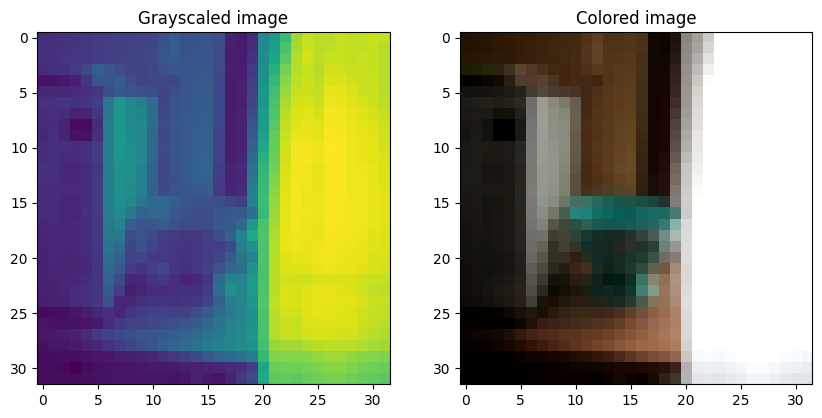

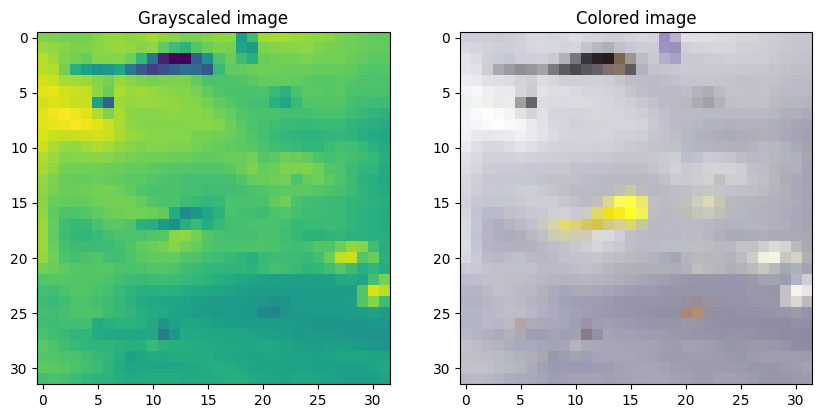

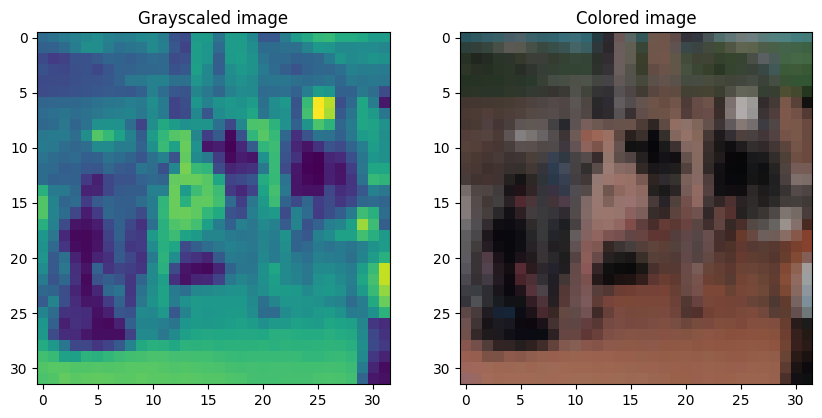

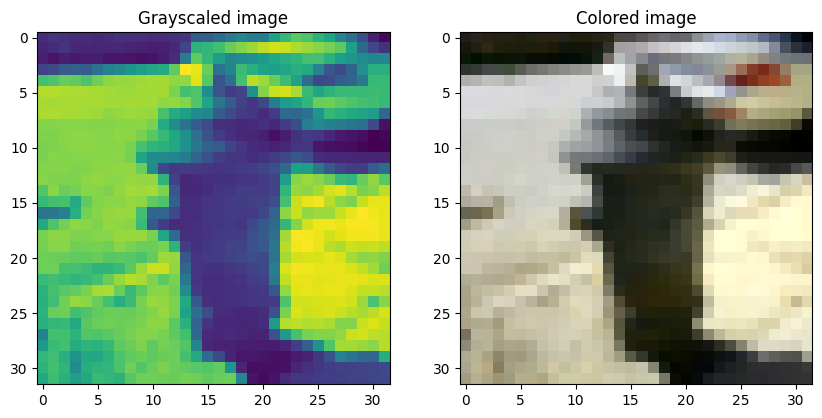

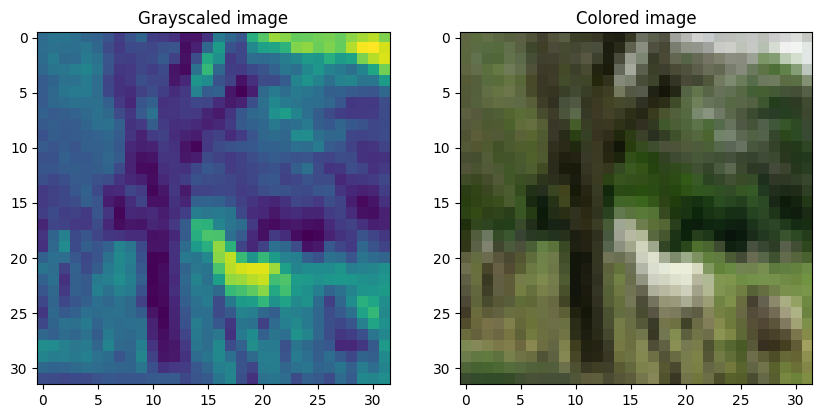

In [162]:
output(train_data, 5)

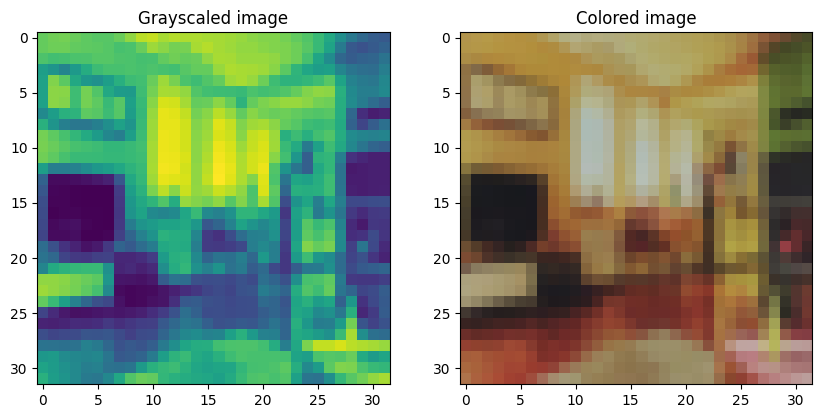

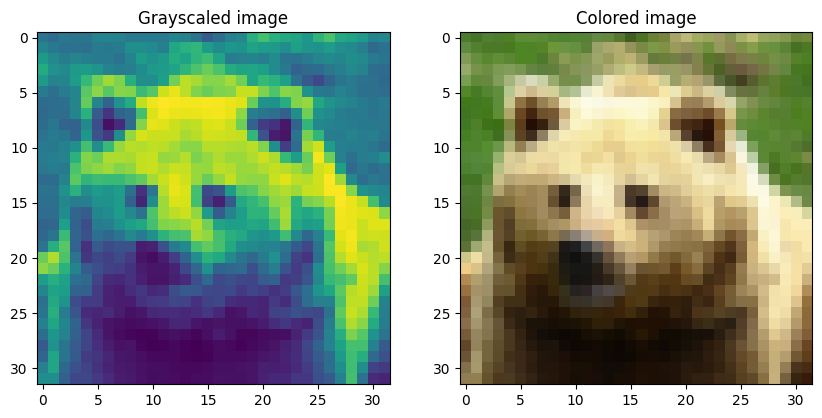

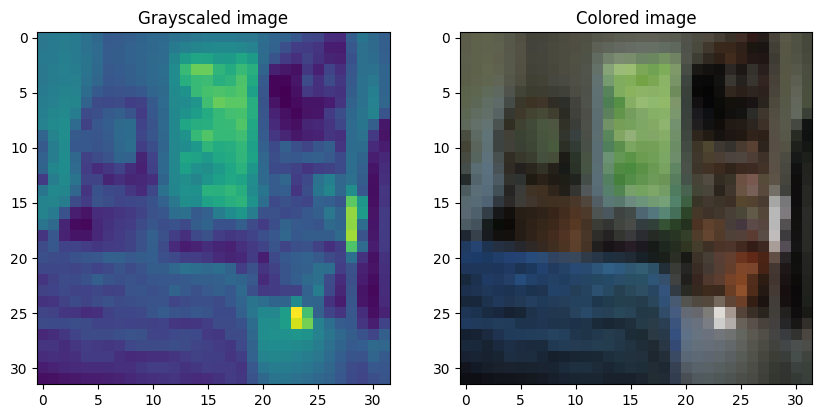

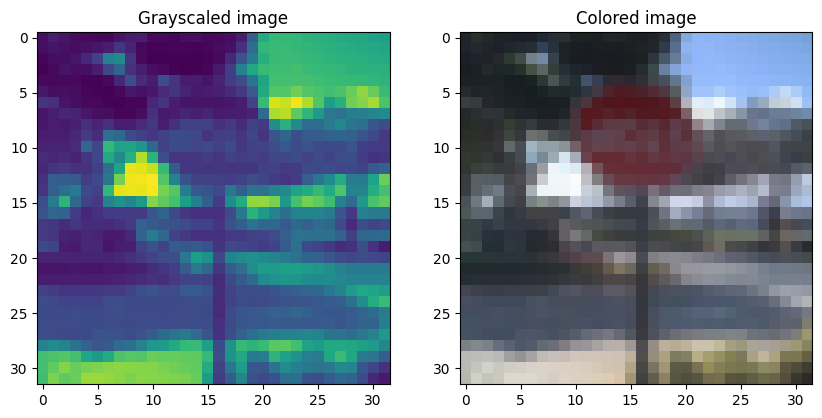

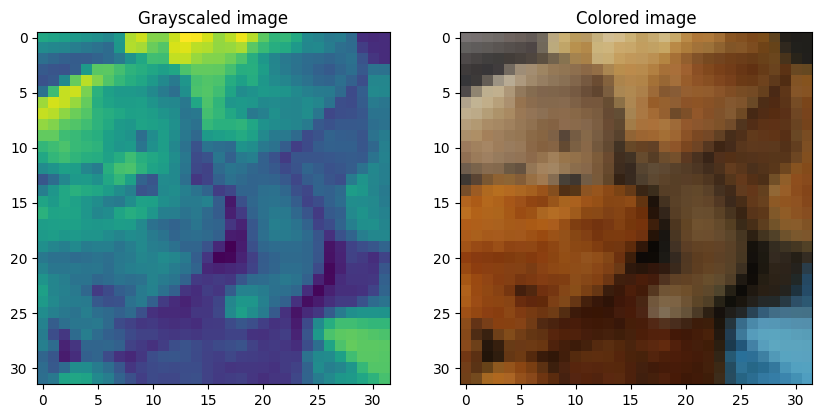

In [91]:
output(val_data, 5)

In [111]:
train_data, _ = random_split(train_data, [0.5, 0.5])
val_data, _ = random_split(val_data, [0.5, 0.5])

In [119]:
train_dl = DataLoader(train_data, batch_size=32, shuffle=True, generator = torch.Generator(device="cpu"))
val_dl = DataLoader(val_data, batch_size=32, shuffle=True, generator = torch.Generator(device="cpu"))

In [112]:
len(train_data)

59144

In [113]:
len(val_data)

2500

In [114]:
class SkipBlock(nn.Module):
    def __init__(self, in_channels, out_channels, pool = False, upsample = False):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 3, padding = 1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3, padding = 1)

        self.add_conv = nn.Sequential()

        if in_channels != out_channels:
            self.add_conv = nn.Conv2d(in_channels, out_channels, kernel_size = 3, padding = 1)

        if pool == True:
            self.pool = nn.MaxPool2d(kernel_size = 2, stride = 2)
        else:
            self.pool = None


        if upsample == True:
            self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        else:
            self.upsample = None
            

    def forward(self, x):
        out = self.conv1(x)
        add_out = self.add_conv(x)

        
        out = F.relu(out)
        out = self.conv2(out)
        out += add_out

        out = F.relu(out)

        if self.pool:
            out = self.pool(out)

        if self.upsample:
            out = self.upsample(out)

        return out  

In [120]:
block = SkipBlock(1, 32)
tensor = torch.rand(1, 64, 64)

out = block(tensor)
out.shape

torch.Size([32, 64, 64])

In [121]:
class SkipTransposeBlock(nn.Module):
    def __init__(self, in_channels, out_channels, upsample=False):
        super().__init__()

        self.transpose1 = nn.ConvTranspose2d(in_channels=in_channels, out_channels=out_channels, kernel_size = 3, padding = 1)
        self.transpose2 = nn.ConvTranspose2d(in_channels=out_channels, out_channels=out_channels, kernel_size = 3, padding = 1)

        self.add_transpose = nn.Sequential()

        if in_channels != out_channels:
            self.add_transpose = nn.ConvTranspose2d(in_channels=in_channels, out_channels=out_channels, kernel_size = 3, padding = 1)

        if upsample == True:
            self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        else:
            self.upsample = None

    def forward(self, x):
        out = self.transpose1(x)
        add_out =  self.add_transpose(x)

        out = F.relu(out)

        out = self.transpose2(out)
        out += add_out

        if self.upsample:
            out = self.upsample(out)

        out = F.relu(out)

        return out
        

In [122]:
block = SkipTransposeBlock(64, 32)
tensor = torch.rand(64, 64, 64)

out = block(tensor)
out.shape

torch.Size([32, 64, 64])

In [123]:
class SEBlock(nn.Module):
    def __init__(self, C, r):
        super().__init__()

        self.aap = nn.AdaptiveAvgPool2d((1, 1))
        self.flatten = nn.Flatten()

        self.linear1 = nn.Linear(C, C//r)
        self.linear2 = nn.Linear(C//r, C)

        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        out = self.aap(x)
        out = self.flatten(out)

        out = self.linear1(out)
        out = self.relu(out)

        out = self.linear2(out)
        out = self.sigmoid(out)

        out = out[:, :, None, None]
        res = out * x

        return res

In [38]:
block = SEBlock(32, 16)
tensor = torch.rand(1, 32, 64, 64)
out = block(tensor)
out.shape

torch.Size([1, 32, 64, 64])

In [124]:
class Painter(nn.Module):
    def __init__(self):
        super().__init__()

        # self.conv1 = nn.Conv2d(in_channels = 1, out_channels = 32, kernel_size=3, padding=1)
        # 1, 224, 224
        self.skip_block1 = SkipBlock(1, 32, pool = False)
        self.se_block1_1 = SEBlock(32, 16)
        # 32, 112, 112
        self.skip_block2 = SkipBlock(32, 64, pool = False)
        # 64, 64, 64
        self.skip_block3 = SkipBlock(64, 128, pool = False)
        self.se_block1_3 = SEBlock(128, 16)
        # 128, 32, 32
        self.up_conv1 = nn.ConvTranspose2d(in_channels = 128, out_channels = 128, kernel_size=7, padding=3)
        # 128, 32, 32
        self.up_conv_block2 = SkipTransposeBlock(256, 64, upsample = False)
        # 64, 64, 64
        self.up_conv_block3 = SkipTransposeBlock(128, 32, upsample = False)
        # 32, 112, 112
        self.up_conv_block4 = SkipTransposeBlock(64, 3, upsample = False)
        # 3, 224, 224
        



    def forward(self, x):
        # 1, 224, 224
        out1 = self.skip_block1(x)
        out1 = self.se_block1_1(out1)
        # 32, 112, 112
        out2 = self.skip_block2(out1)
        # 64, 64, 64
        out3 = self.skip_block3(out2)
        out3 = self.se_block1_3(out3)
        # 128, 32, 32
        
        up4 = self.up_conv1(out3)
        up4 = F.leaky_relu(up4)
        # 128, 32, 32

        up4 = torch.concat([out3, up4], dim=1)
        # 256, 32, 32
        up3 = self.up_conv_block2(up4)
        # 64, 64, 64

        up3 = torch.concat([out2, up3], dim=1)
        # 128, 64, 64
        up2 = self.up_conv_block3(up3)
        # 32, 112, 112

        up2 = torch.concat([out1, up2], dim=1)
        # 64, 112, 112
        res = self.up_conv_block4(up2)
        # 3, 224, 224

        return res 

    def predict(self, x):
        self.eval()
        x = x.to(device)

        if len(x.shape) == 3:
            x = x.unsqueeze(0)

        with torch.no_grad():
            out = self.forward(x)

        return out 

    
    
        

In [125]:
model = Painter()
model.to(device)

Painter(
  (skip_block1): SkipBlock(
    (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (add_conv): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (se_block1_1): SEBlock(
    (aap): AdaptiveAvgPool2d(output_size=(1, 1))
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (linear1): Linear(in_features=32, out_features=2, bias=True)
    (linear2): Linear(in_features=2, out_features=32, bias=True)
    (relu): ReLU()
    (sigmoid): Sigmoid()
  )
  (skip_block2): SkipBlock(
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (add_conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (skip_block3): SkipBlock(
    (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(128, 128, kernel_siz

In [41]:
!pip install torchsummary

In [126]:
from torchsummary import summary

summary(model, input_size=(1, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 32, 32]             320
            Conv2d-2           [-1, 32, 32, 32]             320
            Conv2d-3           [-1, 32, 32, 32]           9,248
         SkipBlock-4           [-1, 32, 32, 32]               0
 AdaptiveAvgPool2d-5             [-1, 32, 1, 1]               0
           Flatten-6                   [-1, 32]               0
            Linear-7                    [-1, 2]              66
              ReLU-8                    [-1, 2]               0
            Linear-9                   [-1, 32]              96
          Sigmoid-10                   [-1, 32]               0
          SEBlock-11           [-1, 32, 32, 32]               0
           Conv2d-12           [-1, 64, 32, 32]          18,496
           Conv2d-13           [-1, 64, 32, 32]          18,496
           Conv2d-14           [-1, 64,

In [96]:
def train(model, train_dl, val_dl, loss_fn, psnr, ssim, optimizer, epochs, device):
    history = {
        "train_loss": [],
        "val_loss": [],
        
        "train_psnr": [],
        "val_psnr": [],

        "train_ssim": [],
        "val_ssim": []
    }

    for epoch in range(epochs):
        train_loss = 0.0
        train_psnr = 0.0
        train_ssim = 0.0

        model.train()

        for x, y in tqdm(train_dl):
            x = x.to(device)
            y = y.to(device)

            optimizer.zero_grad()
            preds = model(x)

            loss = loss_fn(preds, y)
            train_loss += loss.item()
            
            loss.backward()
            optimizer.step()

            t_psnr = psnr(preds.cpu().detach().numpy(), y.cpu().detach().numpy(), data_range=1.0)
            train_psnr += t_psnr.item()

            t_ssim = ssim(preds.cpu().detach().numpy(), y.cpu().detach().numpy(), win_size=3, channel_axis=-1, data_range=1.0)
            train_ssim += t_ssim.item()

        total_train_loss = train_loss / len(train_dl)
        total_train_psnr = train_psnr / len(train_dl)
        total_train_ssim = train_ssim / len(train_dl)


        model.eval()
        val_loss = 0.0
        val_psnr = 0.0
        val_ssim = 0.0

        with torch.no_grad():
            for x, y in tqdm(val_dl):
                x = x.to(device)
                y = y.to(device)
    
                preds = model(x)
    
                loss = loss_fn(preds, y)
                val_loss += loss.item()
    
                t_psnr = psnr(preds.cpu().detach().numpy(), y.cpu().detach().numpy(), data_range=1.0)
                val_psnr += t_psnr.item()
    
                t_ssim = ssim(preds.cpu().detach().numpy(), y.cpu().detach().numpy(), win_size=3, channel_axis=-1, data_range=1.0)
                val_ssim += t_ssim.item()

        total_val_loss = val_loss / len(val_dl)
        total_val_psnr = val_psnr / len(val_dl)
        total_val_ssim = val_ssim / len(val_dl)

        history["train_loss"].append(total_train_loss)
        history["val_loss"].append(total_val_loss)
        
        history["train_psnr"].append(total_train_psnr)
        history["val_psnr"].append(total_val_psnr)

        history["train_ssim"].append(total_train_ssim)
        history["val_ssim"].append(total_val_ssim)

        print(f"Epoch: {epoch+1}; train_loss: {total_train_loss:.4f}; train_psnr: {total_train_psnr:.4f}; train_ssim: {total_train_ssim:.4f}; val_loss: {total_val_loss:.4f}; val_psnr: {total_val_psnr:.4f}; val_ssim: {total_val_ssim:.4f}")
    
    return history       
        

In [127]:
loss_fn = nn.MSELoss()
optimizer = AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)

In [128]:
history = train(model, train_dl, val_dl, loss_fn, psnr, ssim, optimizer, 20, device)

100%|██████████| 79/79 [00:53<00:00,  1.47it/s]


Epoch: 1; train_loss: 0.0124; train_psnr: 19.4382; train_ssim: 0.8214; val_loss: 0.0073; val_psnr: 21.4526; val_ssim: 0.8890


100%|██████████| 79/79 [00:11<00:00,  6.75it/s]


Epoch: 2; train_loss: 0.0107; train_psnr: 19.7524; train_ssim: 0.8364; val_loss: 0.0062; val_psnr: 22.1918; val_ssim: 0.8896


100%|██████████| 79/79 [00:11<00:00,  6.84it/s]


Epoch: 3; train_loss: 0.0106; train_psnr: 19.8160; train_ssim: 0.8387; val_loss: 0.0059; val_psnr: 22.3604; val_ssim: 0.8919


100%|██████████| 79/79 [00:11<00:00,  6.87it/s]


Epoch: 4; train_loss: 0.0104; train_psnr: 19.8708; train_ssim: 0.8413; val_loss: 0.0059; val_psnr: 22.3815; val_ssim: 0.8954


100%|██████████| 79/79 [00:11<00:00,  7.04it/s]


Epoch: 5; train_loss: 0.0103; train_psnr: 19.9269; train_ssim: 0.8433; val_loss: 0.0062; val_psnr: 22.1836; val_ssim: 0.8939


100%|██████████| 79/79 [00:11<00:00,  6.74it/s]


Epoch: 6; train_loss: 0.0102; train_psnr: 19.9602; train_ssim: 0.8448; val_loss: 0.0057; val_psnr: 22.5357; val_ssim: 0.8991


100%|██████████| 79/79 [00:11<00:00,  7.12it/s]


Epoch: 7; train_loss: 0.0101; train_psnr: 19.9975; train_ssim: 0.8459; val_loss: 0.0058; val_psnr: 22.4485; val_ssim: 0.8980


100%|██████████| 79/79 [00:11<00:00,  7.12it/s]


Epoch: 8; train_loss: 0.0101; train_psnr: 20.0101; train_ssim: 0.8464; val_loss: 0.0056; val_psnr: 22.6042; val_ssim: 0.8986


100%|██████████| 79/79 [00:10<00:00,  7.29it/s]


Epoch: 9; train_loss: 0.0101; train_psnr: 20.0155; train_ssim: 0.8473; val_loss: 0.0057; val_psnr: 22.5425; val_ssim: 0.8998


100%|██████████| 79/79 [00:11<00:00,  6.97it/s]


Epoch: 10; train_loss: 0.0100; train_psnr: 20.0406; train_ssim: 0.8478; val_loss: 0.0057; val_psnr: 22.4813; val_ssim: 0.8992


100%|██████████| 79/79 [00:11<00:00,  6.85it/s]


Epoch: 11; train_loss: 0.0100; train_psnr: 20.0717; train_ssim: 0.8494; val_loss: 0.0060; val_psnr: 22.3101; val_ssim: 0.9002


100%|██████████| 79/79 [00:11<00:00,  6.83it/s]


Epoch: 12; train_loss: 0.0100; train_psnr: 20.0563; train_ssim: 0.8492; val_loss: 0.0056; val_psnr: 22.6408; val_ssim: 0.8984


100%|██████████| 79/79 [00:13<00:00,  5.99it/s]


Epoch: 13; train_loss: 0.0099; train_psnr: 20.0905; train_ssim: 0.8496; val_loss: 0.0055; val_psnr: 22.7274; val_ssim: 0.9031


100%|██████████| 79/79 [00:11<00:00,  6.95it/s]


Epoch: 14; train_loss: 0.0099; train_psnr: 20.1069; train_ssim: 0.8508; val_loss: 0.0058; val_psnr: 22.3970; val_ssim: 0.8990


100%|██████████| 79/79 [00:11<00:00,  7.06it/s]


Epoch: 15; train_loss: 0.0099; train_psnr: 20.1102; train_ssim: 0.8513; val_loss: 0.0056; val_psnr: 22.6073; val_ssim: 0.9014


100%|██████████| 79/79 [00:11<00:00,  6.79it/s]


Epoch: 16; train_loss: 0.0098; train_psnr: 20.1512; train_ssim: 0.8526; val_loss: 0.0057; val_psnr: 22.4864; val_ssim: 0.9023


100%|██████████| 79/79 [00:11<00:00,  6.88it/s]


Epoch: 17; train_loss: 0.0098; train_psnr: 20.1531; train_ssim: 0.8527; val_loss: 0.0056; val_psnr: 22.5850; val_ssim: 0.9024


100%|██████████| 79/79 [00:11<00:00,  7.05it/s]


Epoch: 18; train_loss: 0.0097; train_psnr: 20.1648; train_ssim: 0.8530; val_loss: 0.0056; val_psnr: 22.5661; val_ssim: 0.9004


100%|██████████| 79/79 [00:11<00:00,  7.04it/s]


Epoch: 19; train_loss: 0.0097; train_psnr: 20.1858; train_ssim: 0.8536; val_loss: 0.0054; val_psnr: 22.7350; val_ssim: 0.9015


100%|██████████| 79/79 [00:11<00:00,  6.96it/s]

Epoch: 20; train_loss: 0.0096; train_psnr: 20.2159; train_ssim: 0.8549; val_loss: 0.0054; val_psnr: 22.8104; val_ssim: 0.9050


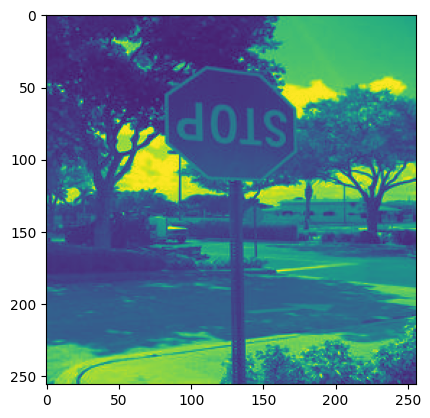

In [139]:
link = "/kaggle/input/image-colorization/val/gray/000000000724.jpg"
img = Image.open(link)
img = test_gray_trasnform(img)
t_img = img.permute(1, 2, 0)
plt.imshow(t_img)


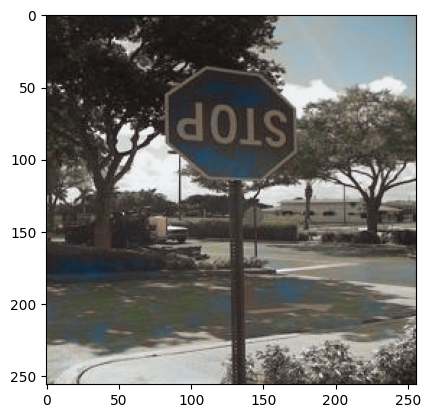

In [148]:
res = model.predict(img)
res = res.squeeze(0)
t_res = res.permute(1, 2, 0)
t_res = t_res.cpu().detach().numpy()
plt.imshow(t_res)

In [149]:
def prediction(link):
    img = Image.open(link)
    img = test_gray_trasnform(img)
    res = model.predict(img)
    res = res.squeeze(0)
    res = res.permute(1, 2, 0)
    res = res.cpu().numpy()
    plt.imshow(res)

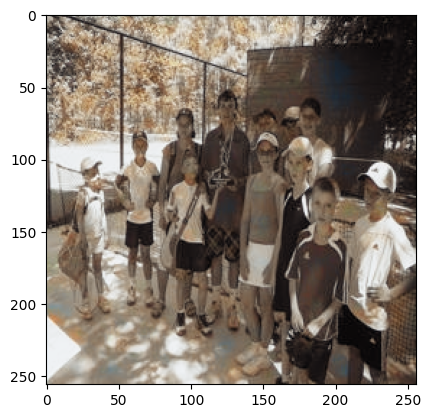

In [151]:
link = "/kaggle/input/image-colorization/val/gray/000000001000.jpg"
prediction(link)

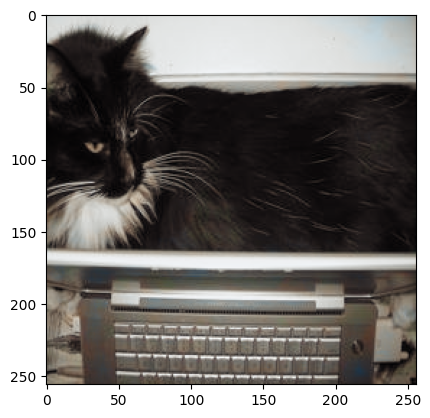

In [152]:
link = "/kaggle/input/image-colorization/val/gray/000000001675.jpg"
prediction(link)

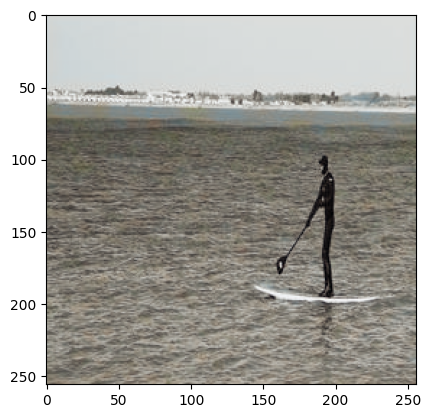

In [156]:
link = "/kaggle/input/image-colorization/val/gray/000000001490.jpg"
prediction(link)

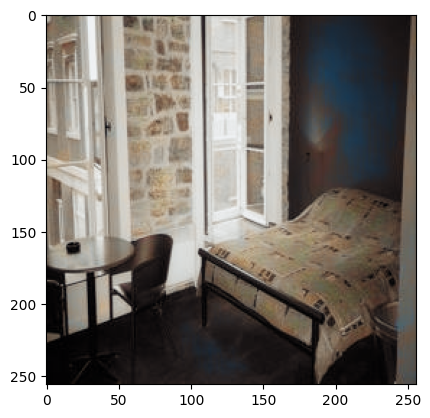

In [157]:
link = "/kaggle/input/image-colorization/val/gray/000000001993.jpg"
prediction(link)

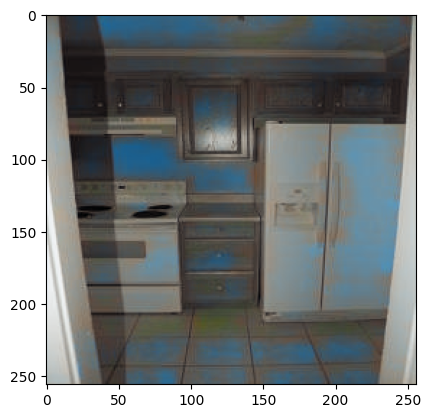

In [158]:
link = "/kaggle/input/image-colorization/val/gray/000000000802.jpg"
prediction(link)

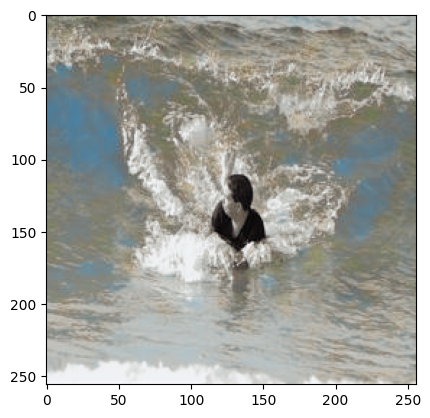

In [159]:
link = "/kaggle/input/image-colorization/val/gray/000000002261.jpg"
prediction(link)

In [196]:
test_gray = "/kaggle/input/image-colorization-dataset/data/train_black"
test_color = "/kaggle/input/image-colorization-dataset/data/train_color"

In [197]:
test_dataset = CustomDataset(test_gray, test_color, test_gray_trasnform, test_gray_trasnform)

In [192]:
def output_test(model, dataset, limit):
    for i, (x, y) in enumerate(dataset):
        x = x.to(device)
        model.to(device)
    
        x_to_display = x.permute(1, 2, 0).to("cpu")
        y = y.permute(1, 2, 0).to("cpu")
    
        res = model.predict(x)
            
        res = res.squeeze(0)
        res = res.permute(1, 2, 0).to("cpu")
        
        plt.figure(figsize=(10, 6))
        
        plt.subplot(1, 3, 1)
        plt.title("Grayscaled image")
        plt.imshow(x_to_display)
        
        plt.subplot(1, 3, 2)
        plt.title("Original image")
        plt.imshow(y)
    
        plt.subplot(1, 3, 3)
        plt.title("Predicted image")
        plt.imshow(res)
    
        plt.show()
    
        if i+1 >= limit:
            break


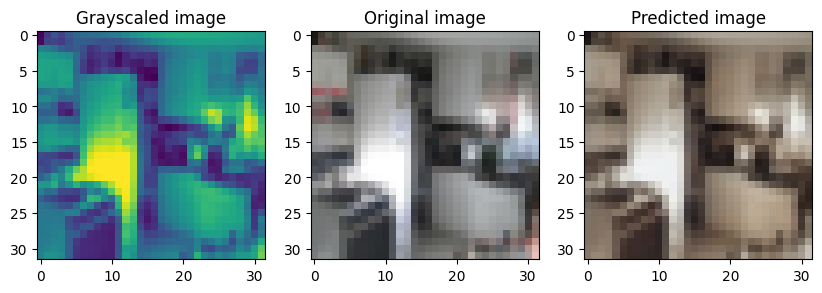

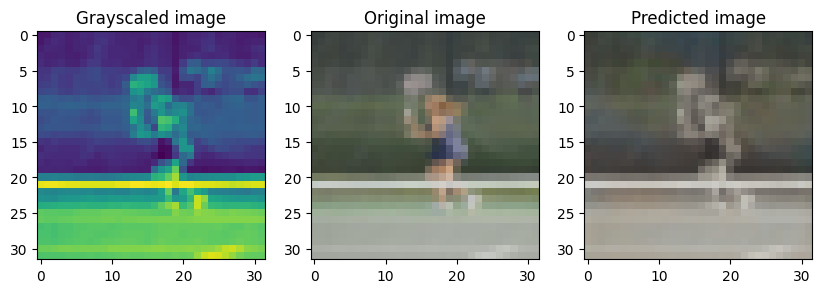

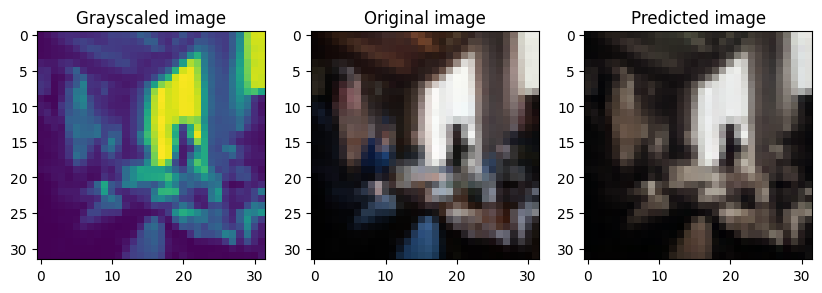

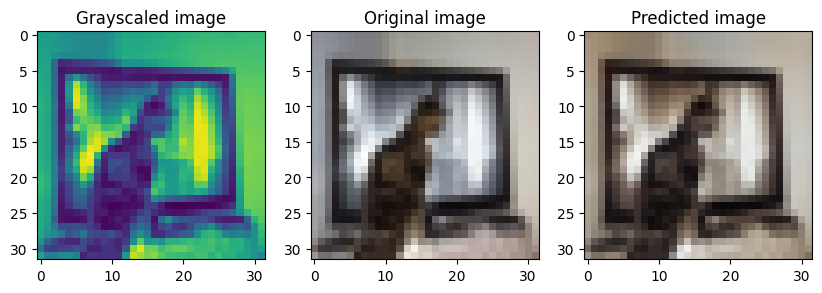

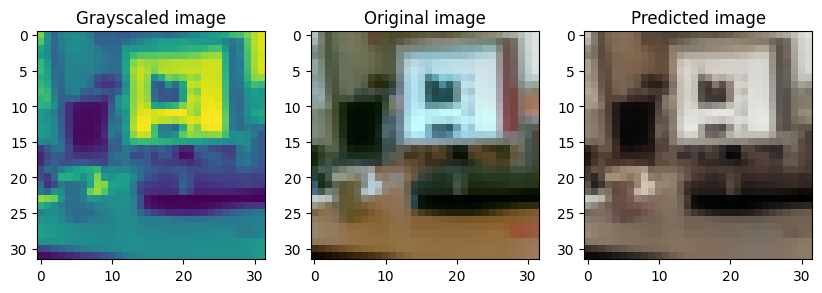

In [193]:
output_test(model, val_data, 5)

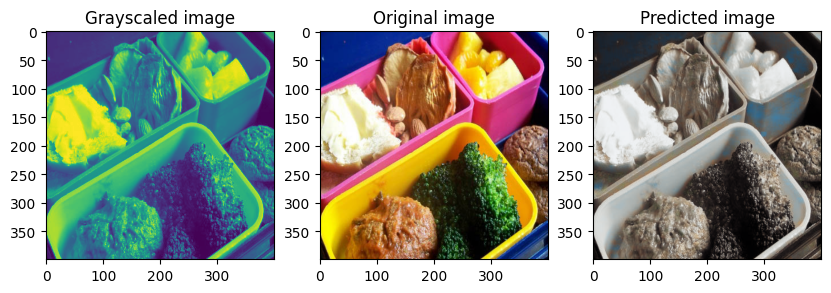

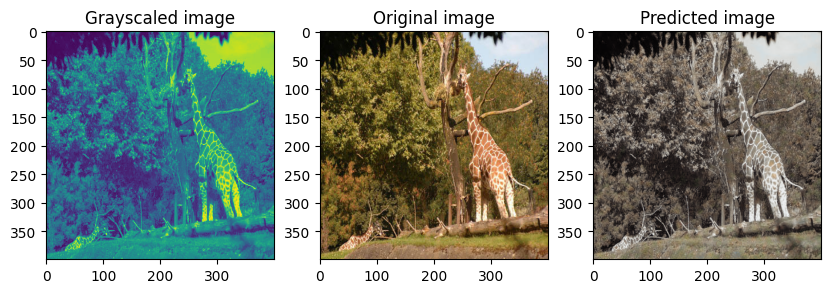

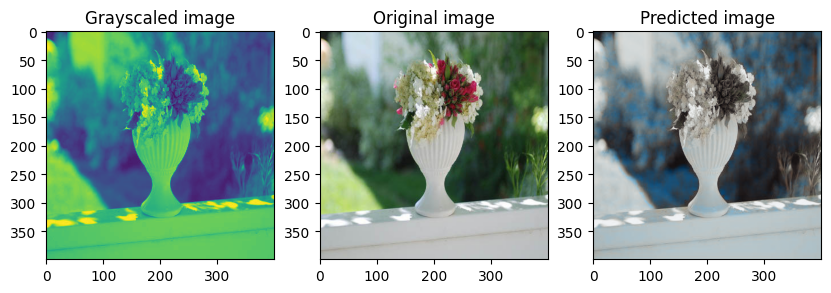

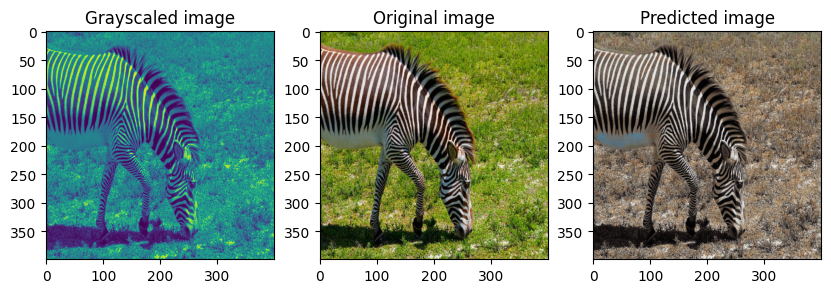

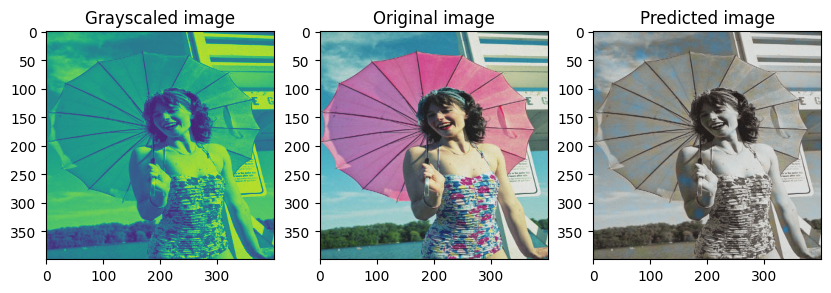

...

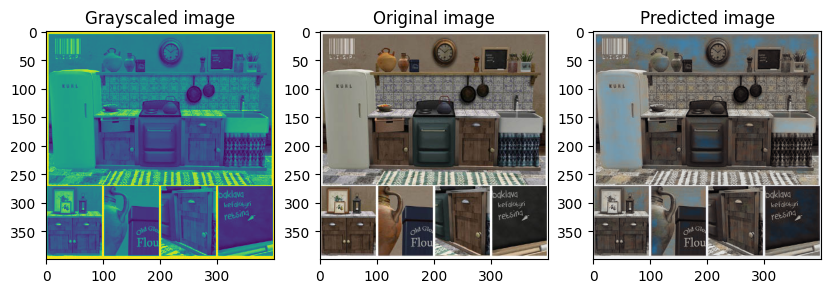

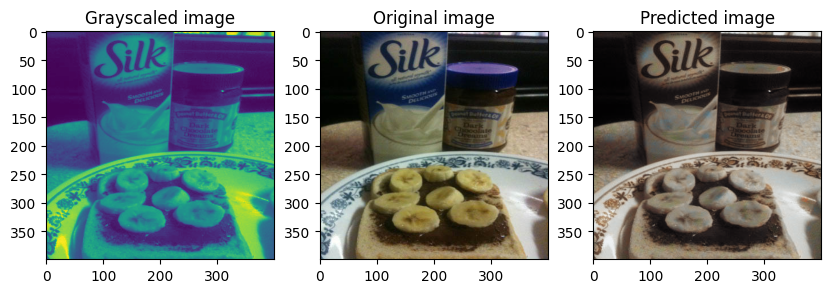

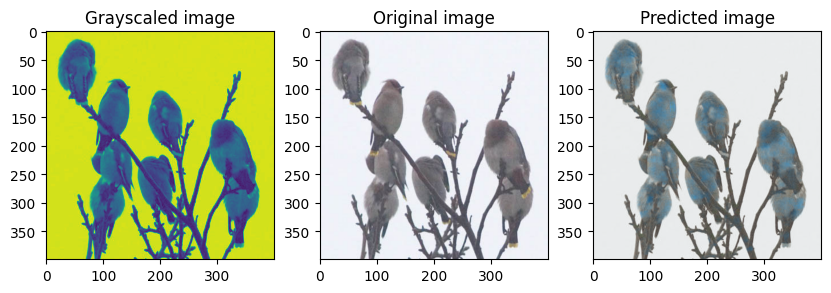

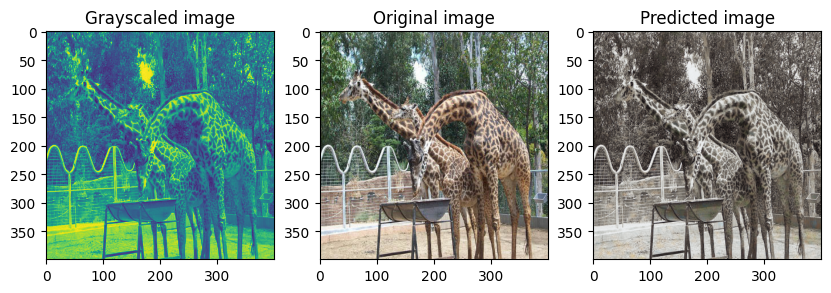

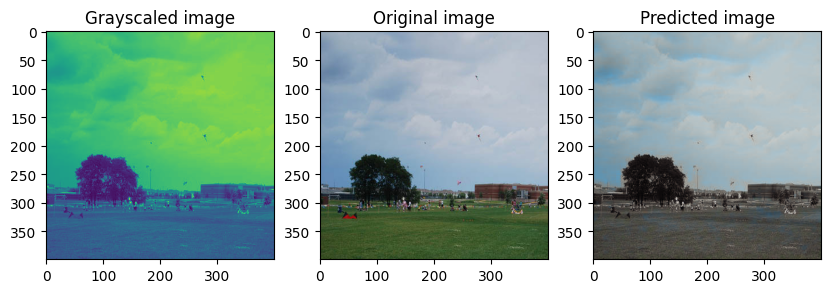

In [198]:
output_test(model, test_dataset, 30)